 # Labyrinthe Partie 2

## Importations

In [1]:
# LES ALGORITHMES
from QLearning import *
from DQN import *
from PPO import *
import time

# POUR AFFICHAGE
import matplotlib.pyplot as plt
import seaborn as sns
from helperPlot import *

# POUR ENVIRONNEMENT
import gymnasium
from gymnasium import spaces
from gymnasium.envs.toy_text.frozen_lake import generate_random_map

## Environnements 1 et 2

In [3]:
class FrozenLakeEnv(gymnasium.Env) :
    def __init__(self, lake_map = generate_random_map(size=4)) :
        super(FrozenLakeEnv, self).__init__()
        self.width = len(lake_map[0])
        self.height = len(lake_map)
        self.action_space = spaces.Discrete(4)
        self.observation_space = spaces.Discrete(self.width * self.height)
        self.map = lake_map
        self.state = 0

        for x in range(self.width) :
            for y in range(self.height) :
                if self.map[y][x] == 'S' :
                    self.state = self._coordinateToState(x, y)
                    break
    
    def reset(self, seed = None, options = None) :
        super().reset(seed = seed)
        self.state = 0

        for x in range(self.width) :
            for y in range(self.height) :
                if self.map[y][x] == 'S' :
                    self.state = self._coordinateToState(x, y)
                    break
        return self.state, {}
    
    def step(self, action) :
        x, y = self._stateToCoordinate(self.state)
        if action == 0 : # Left
            if x > 0 :
                x -= 1
        elif action == 1 : # Down
            if y < self.height -1 :
                y += 1
        elif action == 2 : # Right
            if x < self.width -1 :
                x += 1
        elif action == 3 : # Up
            if y > 0 :
                y -= 1
        
        self.state = self._coordinateToState(x, y)
        
        result = self.map[y][x]
        done = result in ['H', 'G']
        if result == 'G' :
            reward = 1
        elif result == 'H' :
            reward = 0
        else :
            reward = 0
        return self.state, reward, done, False, {}
    
    
    def _stateToCoordinate(self, state) :
        x = state % self.width
        y = state // self.width
        return x, y
    
    def _coordinateToState(self, x, y) :
        return self.width*y + x
    
    def render(self) :
        x, y = self._stateToCoordinate(self.state)
        toPrint = ''
        for i in range(self.height) :
            toPrintRow = ''
            row = self.map[i]
            for j in range(self.width) :
                if (j, i) == (x, y):
                    toPrintRow += '.'
                else :
                    toPrintRow += row[j]
            toPrint += toPrintRow + '\n'
        print(toPrint)

In [4]:
class FrozenLake2Env(gymnasium.Env) :
    def __init__(self, lake_map) :
        super(FrozenLake2Env, self).__init__()
        self.width = len(lake_map[0])
        self.height = len(lake_map)
        self.action_space = spaces.Discrete(4)
        self.observation_space = spaces.Discrete(self.width * self.height)
        self.map = lake_map
        self.state = 0

        for x in range(self.width) :
            for y in range(self.height) :
                if self.map[y][x] == 'S' :
                    self.state = self._coordinateToState(x, y)
                    break
    
    def reset(self, seed = None, options = None) :
        super().reset(seed = seed)
        self.state = 0

        for x in range(self.width) :
            for y in range(self.height) :
                if self.map[y][x] == 'S' :
                    self.state = self._coordinateToState(x, y)
                    break
        return self.state, {}
    
    def step(self, action) :
        x, y = self._stateToCoordinate(self.state)
        if action == 0 : # Left
            if x > 0 :
                x -= 1
        elif action == 1 : # Down
            if y < self.height -1 :
                y += 1
        elif action == 2 : # Right
            if x < self.width -1 :
                x += 1
        elif action == 3 : # Up
            if y > 0 :
                y -= 1
        
        self.state = self._coordinateToState(x, y)
        
        result = self.map[y][x]
        done = result in ['H', 'G']
        if result == 'G' :
            reward = 1
        elif result == 'H' :
            reward = -1
        else :
            reward = -1/(self.width * self.height)
        return self.state, reward, done, False, {}
    
    
    def _stateToCoordinate(self, state) :
        x = state % self.width
        y = state // self.width
        return x, y
    
    def _coordinateToState(self, x, y) :
        return self.width*y + x
    
    def render(self) :
        x, y = self._stateToCoordinate(self.state)
        toPrint = ''
        for i in range(self.height) :
            toPrintRow = ''
            row = self.map[i]
            for j in range(self.width) :
                if (j, i) == (x, y):
                    toPrintRow += '.'
                else :
                    toPrintRow += row[j]
            toPrint += toPrintRow + '\n'
        print(toPrint)

# Une troisième modification de l'environnement

Dans cette troisième version du labyrinthe, on permet à l'agent de voir les 4 cases qui l'entoure en plus de sa position

In [5]:
class FrozenLake3Env(gymnasium.Env) :
    def __init__(self, lake_map) :
        super(FrozenLake3Env, self).__init__()
        self.width = len(lake_map[0])
        self.height = len(lake_map)
        self.cell_values = {'F' : 0, 'S' : 0, 'H' : 1, 'G' : 2, 'W' : 3}
        self.action_space = spaces.Discrete(4)
        self.observation_space = spaces.MultiDiscrete([self.width * self.height, 4, 4, 4, 4])
        self.map = lake_map
        self.state = 0

        for x in range(self.width) :
            for y in range(self.height) :
                if self.map[y][x] == 'S' :
                    self.state = self._coordinateToState(x, y)
                    break
        

    
    def reset(self, seed = None, options = None) :
        super().reset(seed = seed)
        self.state = 0

        for x in range(self.width) :
            for y in range(self.height) :
                if self.map[y][x] == 'S' :
                    self.state = self._coordinateToState(x, y)
                    break


        left, down, right, up = self._getNeighbors(self.state)
        return [self.state, left, down, right, up], {}
    
    def step(self, action) :
        x, y = self._stateToCoordinate(self.state)
        if action == 0 : # Left
            if x > 0 :
                x -= 1
        elif action == 1 : # Down
            if y < self.height -1 :
                y += 1
        elif action == 2 : # Right
            if x < self.width -1 :
                x += 1
        elif action == 3 : # Up
            if y > 0 :
                y -= 1
        
        self.state = self._coordinateToState(x, y)
        
        result = self.map[y][x]
        done = result in ['H', 'G']
        if result == 'G' :
            reward = 1
        elif result == 'H' :
            reward = -1
        else :
            reward = -1/(self.width * self.height)

        left, down, right, up = self._getNeighbors(self.state)
        return [self.state, left, down, right, up], reward, done, False, {}
    
    
    def _stateToCoordinate(self, state) :
        x = state % self.width
        y = state // self.width
        return x, y
    
    def _coordinateToState(self, x, y) :
        return self.width*y + x

    def _getNeighbors(self, state) :
        x, y = self._stateToCoordinate(state)
        if x == 0 :  # Retrieve left cell
            left = self.cell_values['W']
        else :
            left = self.cell_values[self.map[y][x-1]]

        if y == self.height -1 :  # Retrieve down cell
            down = self.cell_values["W"]
        else :
            down = self.cell_values[self.map[y+1][x]]

        if x == self.width -1 :   # Retrieve right cell
            right = self.cell_values["W"]
        else :
            right = self.cell_values[self.map[y][x+1]]

        if y == 0 :   # Retrieve up cell
            up = self.cell_values["W"]
        else :
            up = self.cell_values[self.map[y-1][x]]

        return left, down, right, up


    
    def render(self) :
        x, y = self._stateToCoordinate(self.state)
        toPrint = ''
        for i in range(self.height) :
            toPrintRow = ''
            row = self.map[i]
            for j in range(self.width) :
                if (j, i) == (x, y):
                    toPrintRow += '.'
                else :
                    toPrintRow += row[j]
            toPrint += toPrintRow + '\n'
        print(toPrint)

## QLearning

On remarque qu'il n'y a aucune différence entre le second environnement pour le labyrinthe et le troisième.

Observer les cases aux alentours ne change pas les performances du QLearning.

Cela s'explique par le fait que chaque paires (état, action) est considérée comme indépendante, QLearning n'est pas en mesure de généraliser le fait que si l'on observe une case trou d'un côté alors il ne faut pas y aller.

.FHF
FFFF
FHFF
FHFG



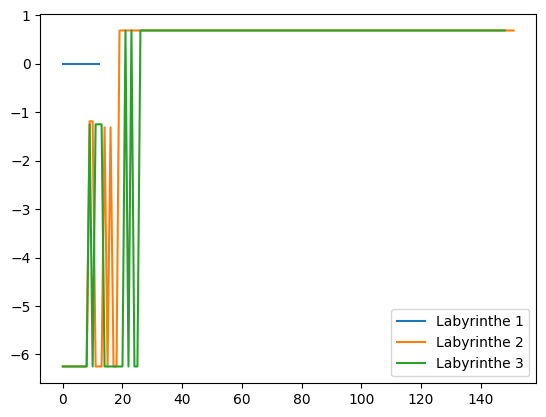

In [7]:
size = 4
timesteps = 1000

lake_map = generate_random_map(size)

env1 = FrozenLakeEnv(lake_map)
env2 = FrozenLake2Env(lake_map)
env3 = FrozenLake3Env(lake_map)
env3.render()

model1, _, prodRew1 = train_q_learning(env1, timesteps = timesteps, useProdForReward = True, alpha = 1, eps_start = 1, eps_end = 0)
model2, _, prodRew2 = train_q_learning(env2, timesteps = timesteps, useProdForReward = True, alpha = 1, eps_start = 1, eps_end = 0)
model3, _, prodRew3 = train_q_learning(env3, timesteps = timesteps, useProdForReward = True, alpha = 1, eps_start = 1, eps_end = 0)

plt.plot(prodRew1, label="Labyrinthe 1")
plt.plot(prodRew2, label="Labyrinthe 2")
plt.plot(prodRew3, label="Labyrinthe 3")
plt.legend()
plt.show()


## DQN

### Observations taille 4

.FFF
FFHF
FFHF
FHFG



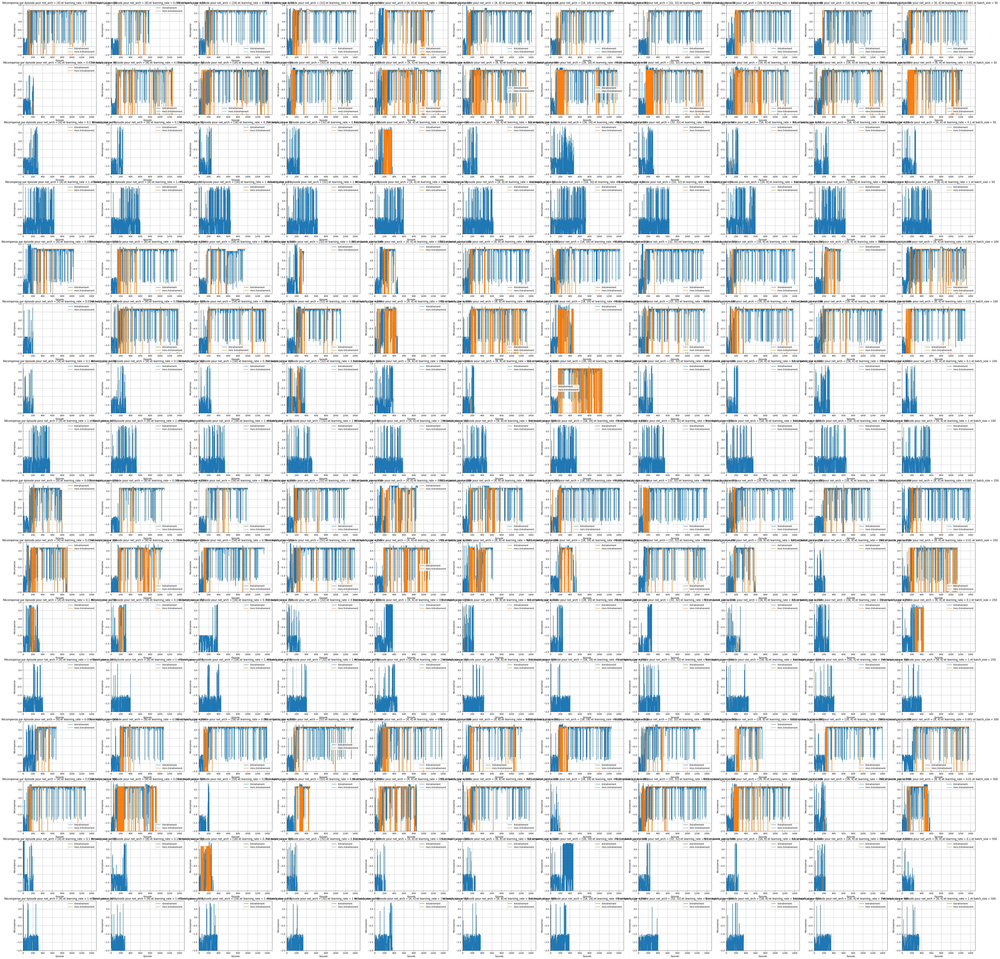

In [8]:
net_arch = [[4], [8], [16], [32], [4, 4], [8, 8], [16, 16], [32, 32], [16, 8], [16, 4], [8, 4]]
lr = [0.001, 0.01, 0.1, 1]
batch_size = [50, 100, 250, 500]


timesteps = 10000
savePath = "Labyrinthe_DQN_4.png"

size = 4

env = FrozenLake3Env(lake_map = generate_random_map(size))
env.render()

plot_dqn_performance_forAll3(savePath, env, timesteps, (1500, -2, 1), 
                                    [],
                                    "net_arch", net_arch, 
                                    "learning_rate", lr,
                                    "batch_size", batch_size
                            )


Les architectures [16], [32] et [32, 32] fournissent de bons résultats

.FHF
FFFF
FFFF
HFFG



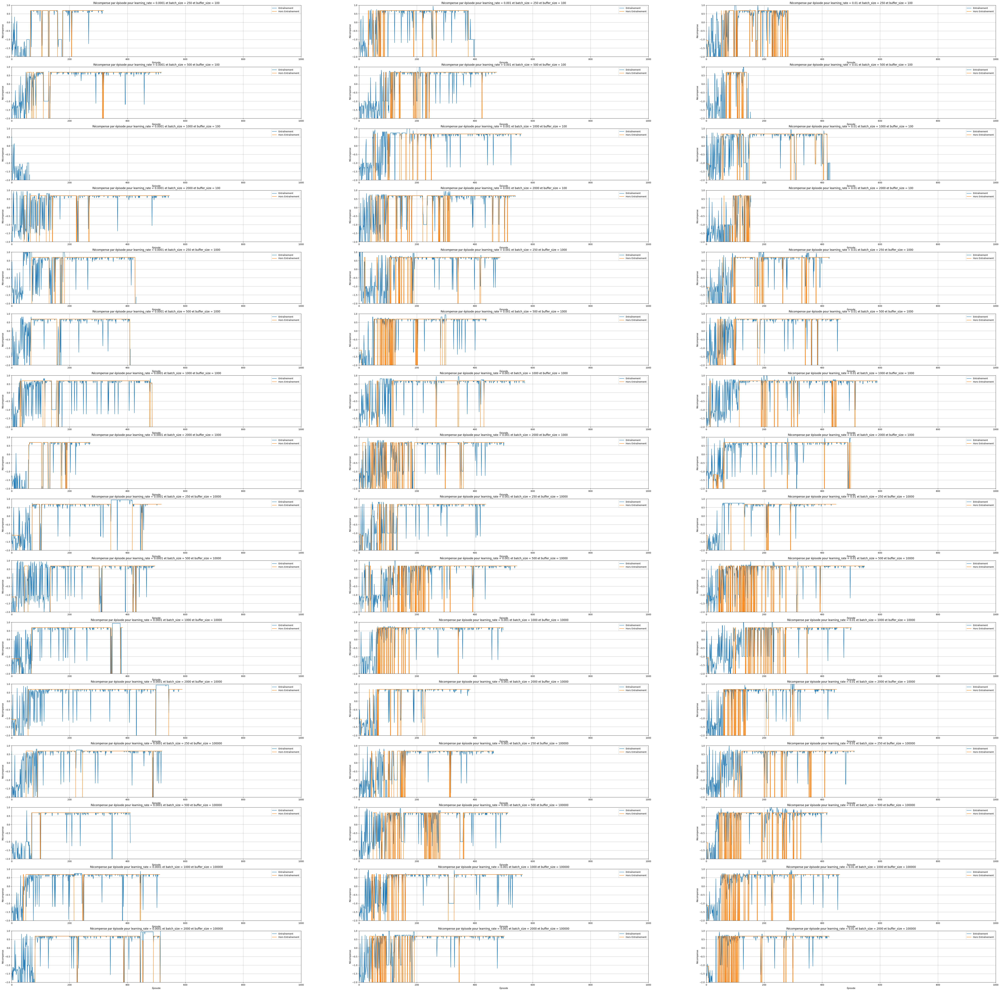

In [9]:
predefined = [('net_arch', [32])]

lr = [0.0001, 0.001, 0.01]
batch_size = [250, 500, 1000, 2000]
buffer_size = [100, 1000, 10000, 100000]

timesteps = 4000
savePath = "Labyrinthe_DQN_4.png"

size = 4

env = FrozenLake3Env(lake_map = generate_random_map(size))
env.render()

plot_dqn_performance_forAll3(savePath, env, timesteps, (1000, -2, 1), 
                             predefined,
                             "learning_rate", lr,
                             "batch_size", batch_size,
                             "buffer_size", buffer_size
                            )

Les premiers résultats obtenus laissent penser qu'une configuration identique à celle trouvée pour l'environnement 2 devrait permettre l'obtention de résultats corrects

## Comparaison DQN pour env2 et env3

On configure DQN en utilisant les paramètres de l'environnement 2.

.FHF
FFFF
FFHF
HFHG

Entraînement pour labyrinthe de taille 4 sur 10000 timesteps terminé.
Sur l'environnement 2, DQN prend 56.91025710105896 secondes pour son entraînement
Sur l'environnement 3, DQN prend prend 95.14277362823486 secondes pour son entraînement



.FFHFF
FHFHFF
FFFFFH
FHFFFF
FFFFFF
HHFFFG

Entraînement pour labyrinthe de taille 6 sur 40000 timesteps terminé.
Sur l'environnement 2, DQN prend 234.81938314437866 secondes pour son entraînement
Sur l'environnement 3, DQN prend prend 307.65092372894287 secondes pour son entraînement



.FFFFFFF
FFFFFFHF
FHFFFHFH
FFFFFFHF
FFFFFHFF
HHFHFFFF
HFFFFFFF
FFFHFFFG

Entraînement pour labyrinthe de taille 8 sur 40000 timesteps terminé.
Sur l'environnement 2, DQN prend 247.12077927589417 secondes pour son entraînement
Sur l'environnement 3, DQN prend prend 351.7212424278259 secondes pour son entraînement



.FFFFHHFFF
FFFFFFFFFF
HFFFFHFFFF
FFFHFFFFFF
FFFFFFFFFF
FFFFFHFFHF
FFFHFHFFFF
FFFFHFFFHF
FFFFFFFFFF
FFFHHFFFHG

Entraînement pour la

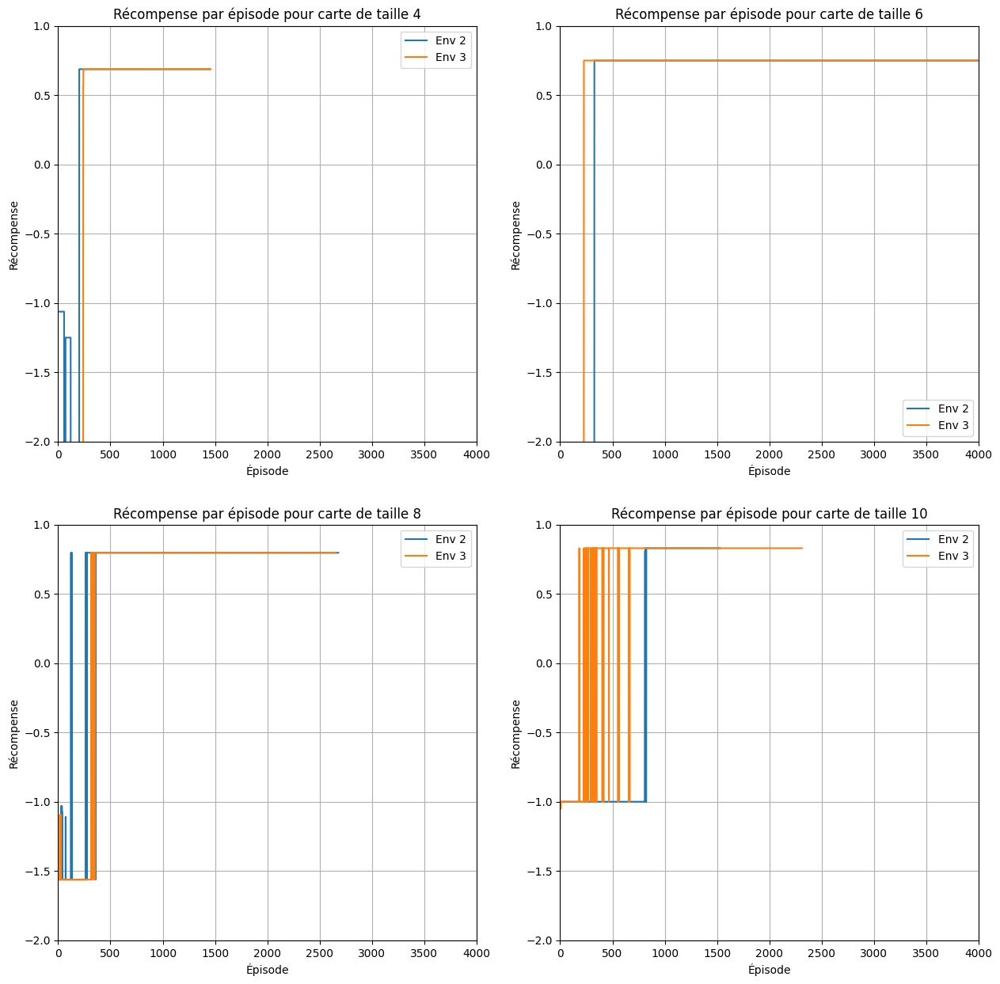

In [10]:
data = [(4, 10000, 4000, 0, 0, (1, 0.05, 0.5, 0.0001, 0.9, [32], 50, 10000, 1000)),
        (6, 40000, 4000, 0, 1, (1, 0.05, 0.5, 0.0001, 0.9, [32], 50, 10000, 1000)),
        (8, 40000, 4000, 1, 0, (1, 0.05, 0.5, 0.0001, 0.9, [32], 50, 10000, 1000)),
        (10, 40000, 4000, 1, 1, (1, 0.05, 0.5, 0.0001, 0.9, [32, 32], 50, 10000, 1000))]
fig, axes = plt.subplots(2, 2, figsize=(15, 15))


for (size, timesteps, maxX, x, y,
     (eps_start, eps_end, eps_frac, lr, gamma, net_arch, update_freq, buffer_size, batch_size)
    ) in data :
    lake_map = generate_random_map(size = size)
    env1 = FrozenLake2Env(lake_map = lake_map)
    env2 = FrozenLake3Env(lake_map = lake_map)
    env1.render()

    
    start = time.time()
    DQNmodel, DQNrewards, prod1 = train_dqn(env1, exploration_initial_eps = eps_start, batch_size = batch_size, buffer_size=buffer_size,
              exploration_fraction = eps_frac, exploration_final_eps = eps_end, learning_rate = lr, update_freq = update_freq, gamma = gamma, net_arch = net_arch,
              timesteps = timesteps, useProdForReward = True)
    end = time.time()

    
    env1Chrono = end-start

    
    start = time.time()
    DQNmodel, DQNrewards, prod2 = train_dqn(env2, exploration_initial_eps = eps_start, batch_size = batch_size, buffer_size=buffer_size,
              exploration_fraction = eps_frac, exploration_final_eps = eps_end, learning_rate = lr, update_freq = update_freq, gamma = gamma, net_arch = net_arch,
              timesteps = timesteps, useProdForReward = True)
    end = time.time()

    env2Chrono = end-start


    print(f"Entraînement pour labyrinthe de taille {size} sur {timesteps} timesteps terminé.")
    print(f"Sur l'environnement 2, DQN prend {env1Chrono} secondes pour son entraînement")
    print(f"Sur l'environnement 3, DQN prend prend {env2Chrono} secondes pour son entraînement")

    print("\n\n")
    
    
    axes[x, y].plot(prod1, label='Env 2')     # Afin d'éviter le bruit, on affiche les récompenses d'exploitation
    axes[x, y].plot(prod2, label='Env 3')
    axes[x, y].set_xlim([0, maxX])
    axes[x, y].set_ylim([-2, 1])
    axes[x, y].legend()
    axes[x, y].set_xlabel("Épisode")
    axes[x, y].set_ylabel("Récompense")
    axes[x, y].set_title(f"Récompense par épisode pour carte de taille {size}")
    axes[x, y].grid()
plt.show()

## Environnement Box

Pour les labyrinthes de grande taille, les environnements 1, 2 et 3 posent problème : le nombre de neurones de la couche d'entrée est bien trop grand.

Cela ralentit considérablement le temps d'entraînement de DQN.

Afin de pouvoir entraîner un agent DQN sur un grand labyrinthe, il faut que l'on représente les positions à l'aide d'entiers.
Quelque soit la taille du labyrinthe, DQN aura toujours 18 neurones, l'entraînement sera plus rapide.

In [2]:
class FrozenLake4Env(gymnasium.Env) :
    def __init__(self, lake_map) :
        super(FrozenLake4Env, self).__init__()
        self.width = len(lake_map[0])
        self.height = len(lake_map)
        self.cell_values = {'F' : 0, 'S' : 0, 'H' : 1, 'G' : 2, 'W' : 3}
        self.action_space = spaces.Discrete(4)
        self.observation_space = spaces.Dict({
            'row_position' : spaces.Box(low = 0, high = self.width - 1, dtype = int),
            'col_position' : spaces.Box(low = 0, high = self.height - 1, dtype = int),
            'left_neighbor' : spaces.Discrete(4),
            'down_neighbor' : spaces.Discrete(4),
            'right_neighbor' : spaces.Discrete(4),
            'up_neighbor' : spaces.Discrete(4)
        })
        self.map = lake_map
        self.state = 0

        for x in range(self.width) :
            for y in range(self.height) :
                if self.map[y][x] == 'S' :
                    self.state = self._coordinateToState(x, y)
                    break
        

    
    def reset(self, seed = None, options = None) :
        super().reset(seed = seed)
        self.state = 0

        for x in range(self.width) :
            for y in range(self.height) :
                if self.map[y][x] == 'S' :
                    self.state = self._coordinateToState(x, y)
                    self.x = x
                    self.y = y
                    break


        left, down, right, up = self._getNeighbors(self.state)
        toReturn = {
            'row_position' : [self.x],
            'col_position' : [self.y],
            'left_neighbor' : left,
            'down_neighbor' : down,
            'right_neighbor' : right,
            'up_neighbor' : up
        }
        return toReturn, {}
    
    def step(self, action) :
        self.x, self.y = self._stateToCoordinate(self.state)
        if action == 0 : # Left
            if self.x > 0 :
                self.x -= 1
        elif action == 1 : # Down
            if self.y < self.height -1 :
                self.y += 1
        elif action == 2 : # Right
            if self.x < self.width -1 :
                self.x += 1
        elif action == 3 : # Up
            if self.y > 0 :
                self.y -= 1
        
        self.state = self._coordinateToState(self.x, self.y)
        
        result = self.map[self.y][self.x]
        done = result in ['H', 'G']
        if result == 'G' :
            reward = 1
        elif result == 'H' :
            reward = -1
        else :
            reward = -1/(self.width * self.height)

        left, down, right, up = self._getNeighbors(self.state)
        toReturn = {
            'row_position' : [self.x],
            'col_position' : [self.y],
            'left_neighbor' : left,
            'down_neighbor' : down,
            'right_neighbor' : right,
            'up_neighbor' : up
        }
        return toReturn, reward, done, False, {}
    
    
    def _stateToCoordinate(self, state) :
        x = state % self.width
        y = state // self.width
        return x, y
    
    def _coordinateToState(self, x, y) :
        return self.width*y + x

    def _getNeighbors(self, state) :
        x, y = self._stateToCoordinate(state)
        if x == 0 :  # Retrieve left cell
            left = self.cell_values['W']
        else :
            left = self.cell_values[self.map[y][x-1]]

        if y == self.height -1 :  # Retrieve down cell
            down = self.cell_values["W"]
        else :
            down = self.cell_values[self.map[y+1][x]]

        if x == self.width -1 :   # Retrieve right cell
            right = self.cell_values["W"]
        else :
            right = self.cell_values[self.map[y][x+1]]

        if y == 0 :   # Retrieve up cell
            up = self.cell_values["W"]
        else :
            up = self.cell_values[self.map[y-1][x]]

        return left, down, right, up


    
    def render(self) :
        x, y = self._stateToCoordinate(self.state)
        toPrint = ''
        for i in range(self.height) :
            toPrintRow = ''
            row = self.map[i]
            for j in range(self.width) :
                if (j, i) == (x, y):
                    toPrintRow += '.'
                else :
                    toPrintRow += row[j]
            toPrint += toPrintRow + '\n'
        print(toPrint)

## Entraînement DQN sur environnement 4

### Observations taille 4

In [ ]:
net_arch = [[2], [4], [8], [2, 2], [4, 4], [8, 8], [8, 4], [8, 2], [4, 2]]
lr = [0.001, 0.01, 0.1, 1]
batch_size = [50, 100, 250, 500]


timesteps = 10000
savePath = "Labyrinthe_DQN_4.png"

size = 4

env = FrozenLake4Env(lake_map = generate_random_map(size))
env.render()

plot_dqn_performance_forAll3(savePath, env, timesteps, (1500, -2, 1), 
                                    [],
                                    "net_arch", net_arch, 
                                    "learning_rate", lr,
                                    "batch_size", batch_size
                            )


.FFF
FFFF
FHFF
HFFG



## Labyrinthes de grande taille

Pour un labyrinthe de trop grande taille, QLearning nécessite beacoup trop de mémoire et ne peut donc pas être utilisé.

De plus, avec stable baselines 3, un observation_space discrete est codée avec un one hot encoding.
Le nombre de sommet dans la première couche du réseau augmente bien trop rapidement.

Sequential(
  (0): Linear(in_features=18, out_features=32, bias=True)
  (1): ReLU()
  (2): Linear(in_features=32, out_features=32, bias=True)
  (3): ReLU()
  (4): Linear(in_features=32, out_features=4, bias=True)
)


POIDS entre couche 1 et couche 2
Parameter containing:
tensor([[ 9.7832e-02, -5.0863e-02, -1.9535e-01,  1.9656e-01, -1.6293e-01,
          1.2971e-01,  1.3614e-01, -1.0323e-04, -4.8801e-02,  2.0578e-01,
         -1.7358e-01,  8.3503e-02,  1.0805e-01, -1.1404e-01,  5.9043e-02,
          1.0043e-01, -2.4848e-02,  1.8216e-01],
        [ 2.4995e-02, -2.3532e-02,  3.7839e-02,  9.6076e-02, -4.4793e-02,
         -2.1135e-01,  7.5300e-02, -8.0028e-02, -1.1996e-01,  9.3197e-02,
         -1.4616e-01,  1.6338e-01, -2.2212e-01, -2.2855e-01,  2.2942e-01,
          4.1883e-02,  9.2789e-02,  1.5172e-01],
        [ 1.4270e-01,  3.3136e-04, -2.2543e-02,  2.0286e-01, -1.4631e-02,
          1.3560e-01,  1.2323e-01, -4.6726e-02,  1.3620e-01,  1.4310e-01,
          2.3143e-01, -7.3932e-02, -7.

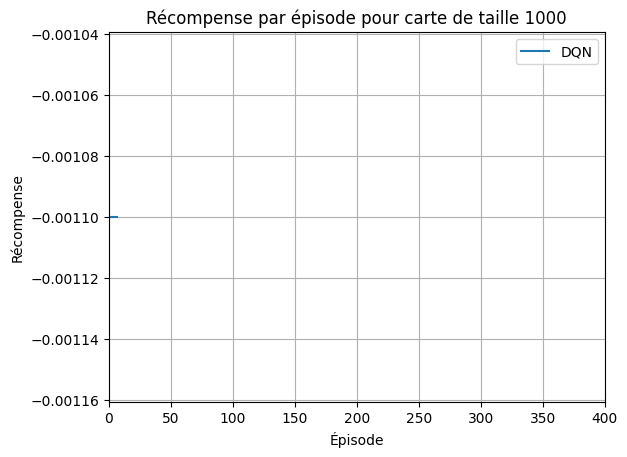

In [3]:
size = 1000

timesteps = 100



lake_map = generate_random_map(size = size)
env = FrozenLake4Env(lake_map = lake_map)

"""
start = time.time()
QTableOpti, Qrew, QrewOpti = train_q_learning(env, timesteps = timesteps, eps_start = 0.05, eps_end = 0.05, alpha = 1, gamma = 0.99,
                                               useProdForReward = True, maxTimestepsProd = 200)
end = time.time()

    
QChrono = end-start
"""
    
start = time.time()
DQNmodel, DQNrewards, DQNrewards_prod_opti = train_dqn(env, exploration_initial_eps = 1, batch_size = 1000, buffer_size=10000,
              exploration_fraction = 0.5, exploration_final_eps = 0.05, learning_rate = 0.0001, update_freq = 50, gamma = 0.9, net_arch = [32, 32],
              timesteps = timesteps, useProdForReward = True, maxTimestepsProd = 1100)
end = time.time()



print(DQNmodel.policy.q_net.q_net)

print('\n\nPOIDS entre couche 1 et couche 2')
print(DQNmodel.policy.q_net.q_net[0].weight)

print('\n\nBIAIS couche 2')
print(DQNmodel.policy.q_net.q_net[0].bias)

print('\n\nPOIDS entre couche 2 et couche 3')
print(DQNmodel.policy.q_net.q_net[2].weight)


print('\n\nBIAIS couche 2')
print(DQNmodel.policy.q_net.q_net[2].bias)




DQNChrono = end-start



print(f"Entraînement pour labyrinthe de taille {size} sur {timesteps} timesteps terminé.")
#print(f"QLearning prend {QChrono} secondes pour son entraînement")
print(f"DQN prend {DQNChrono} secondes pour son entraînement")

print("\n\n")
    
    
#plt.plot(QrewOpti, label='QLearning')     # Afin d'éviter le bruit, on affiche les récompenses d'exploitation
plt.plot(DQNrewards_prod_opti, label='DQN')
plt.xlim([0, 400])
#plt.ylim([-2, 1.05])
plt.legend()
plt.xlabel("Épisode")
plt.ylabel("Récompense")
plt.title(f"Récompense par épisode pour carte de taille {size}")
plt.grid()
plt.show()